# Image classifier with Tensorflow

You can find the dataset used in this projecto in [Tensorflow Datasets](https://www.tensorflow.org/datasets/catalog/cats_vs_dogs?hl=es-419)

In [1]:
import tensorflow as tf
import tensorflow_datasets as tfds

# Download Cats vs Dogs dataset

data, metadata = tfds.load("cats_vs_dogs", as_supervised = True, with_info = True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/cats_vs_dogs/4.0.0.incompleteD7TJL5/cats_vs_dogs-train.tfrecord


  0%|          | 0/23262 [00:00<?, ? examples/s]

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.0. Subsequent calls will reuse this data.


Analize metadata

In [2]:
metadata

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    version=4.0.0,
    description='A large set of images of cats and dogs.There are 1738 corrupted images that are dropped.',
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
    }),
    total_num_examples=23262,
    splits={
        'train': 23262,
    },
    supervised_keys=('image', 'label'),
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, Jared},
    title = {Asirra: A CAPTCHA that Exploits Interest-Aligned Manual Image Categorization},
    booktitle = {Proceedings of 14th ACM Conference on Computer and Communications Security (CCS)},
    ye

The dataset contains 23.262 examples with 3 features each: an image, a file name and a label.

Now wi will inspect come of the examples of the dataset using the function "show_examples" on Tensorflow Datasets. Another way coud be using the "as_dataframe" function

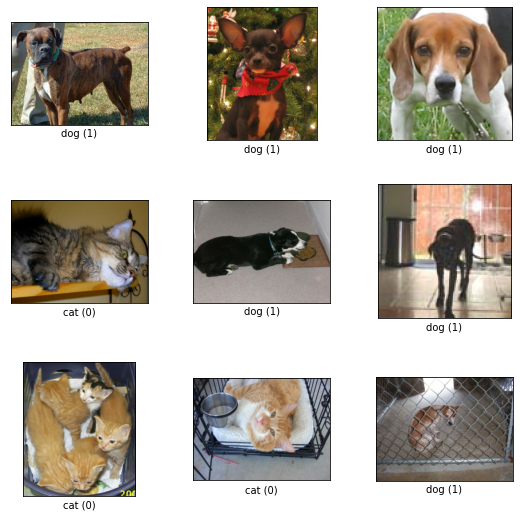

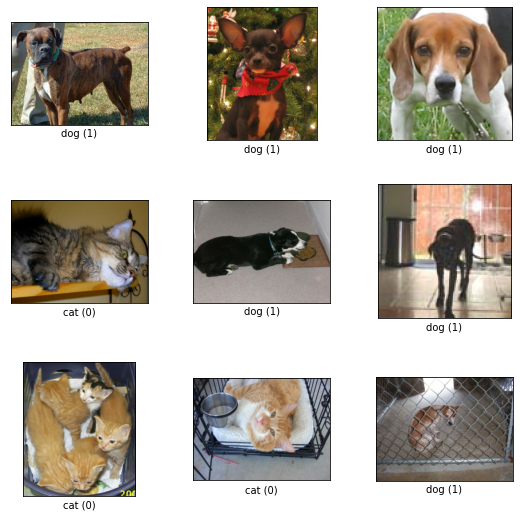

In [3]:
tfds.show_examples(data["train"], metadata)

We will now see the data using Matplotlib for more control

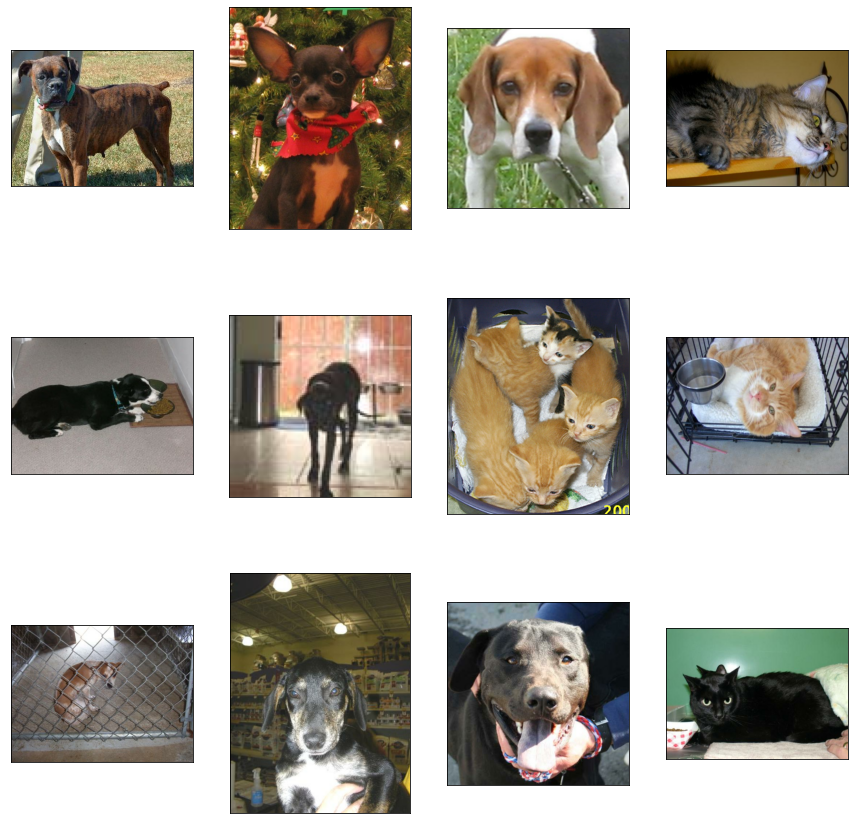

In [4]:
import matplotlib.pyplot as plt

'''
Iteration that recieves the index and the image-label pair
To see more than one image we use plt.subolot
'''

plt.figure(figsize = (15,15))

for i, (image, label) in enumerate(data['train'].take(12)): 
  plt.subplot(3, 4, i+1)
  plt.xticks([])
  plt.yticks([]) # Eliminate X and Y ticks because it doesn't add value
  plt.imshow(image)

### Data manipulation

The following modifications will be made to the training data to optimize the work of the neural network: 

*   Adjust the image size so that all the images have the same dimensions.
*   Change colors to grayscale.

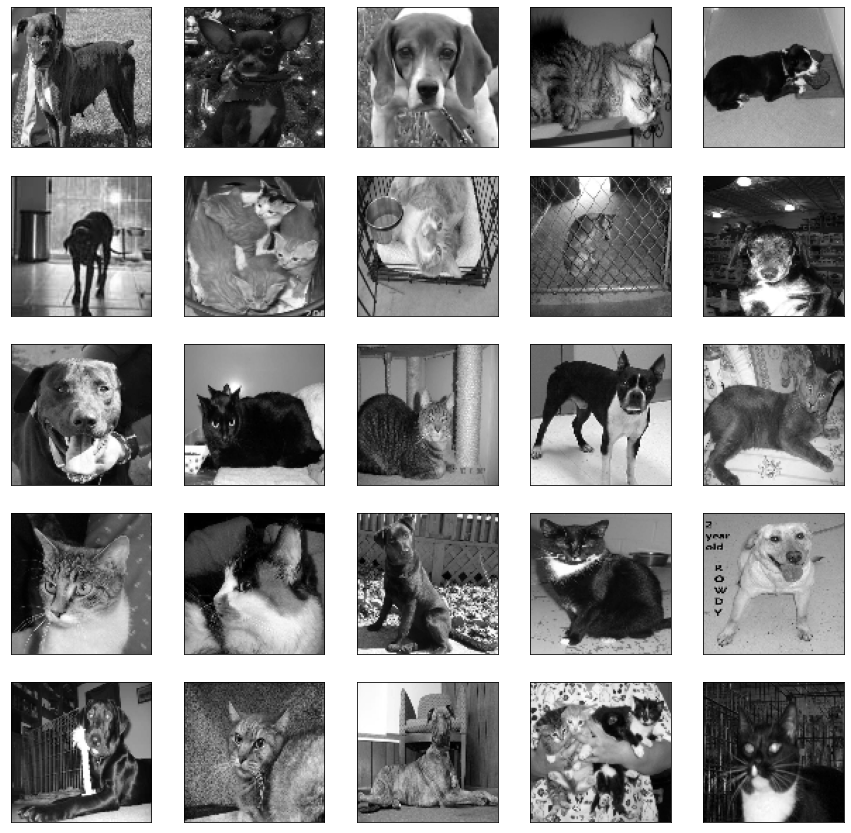

In [5]:
import cv2

img_size = 100

plt.figure(figsize = (15,15))

for i, (image, label) in enumerate(data['train'].take(25)): # Only take 25 images
  image = cv2.resize(image.numpy(),(img_size, img_size)) # Resize image
  image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) # Change color
  plt.subplot(5, 5, i+1)
  plt.xticks([])
  plt.yticks([]) # Eliminate X and Y ticks because it doesn't add value
  plt.imshow(image, cmap = 'gray') # Change to see only gray canal

We now aply the modifications to the training data and save the changes in a new variable dataset

In [6]:
training_data = []

In [7]:
X = [] # Contains all input image data (pixels)
Y = [] # Labels (cat or dog)

for i, (image, label) in enumerate(data['train']): # Take all
  image = cv2.resize(image.numpy(),(img_size, img_size))
  image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  image = image.reshape(img_size, img_size, 1) # Specify that we are only working with 1 color chanel
  training_data.append([image, label])
  X.append(image)
  Y.append(label)

Each element of the list contains the information of all the image's pixels. These values go from 0 to 255, and the labels can be either 0 (cat) or 1 (dog). 

In [8]:
len(training_data)

23262

In the first time, we won't use data augmentation, so we can see the effects of this technique in the overall result.

Now we normalize X so it has only values between 0 and 1



In [9]:
import numpy as np

X = np.array(X).astype(float) / 255 # Convert to float and divide by 255 

Tha label list "Y" has all tensors. We convert it to a simple numpy array

In [10]:
y = np.array(Y)

In [11]:
X.shape

(23262, 100, 100, 1)

### Model Training

We will use 3 different models with and without data augmentation

In [12]:
# First Model: Dense NN

dense_model = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape = (100, 100, 1)), # Input layer
  tf.keras.layers.Dense(150, activation = 'relu'), # 2 Dense layers with 150 neurons each
  tf.keras.layers.Dense(150, activation = 'relu'),
  tf.keras.layers.Dense(1, activation = 'sigmoid') # Output layer.
])

'''
The "sigmoid" activation function gives us a value between 0 and 1,
and we need a response that can be either 0 or 1.
Another way to solve this could be usinf SOFTMAX. Softmax is often used as the 
activation for the last layer of a classification network because the result 
could be interpreted as a probability distribution.
'''

# Second Model: Convolutional NN

cnn_model = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3, 3), activation = 'relu', input_shape = (100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3, 3), activation = 'relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3, 3), activation = 'relu'),
  tf.keras.layers.MaxPooling2D(2, 2), # 3 pairs of convolutional layers and max pooling

  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(100, activation = 'relu'), # Dense layer
  tf.keras.layers.Dense(1, activation = 'sigmoid') # Output layer
])

# Third Model: CNN with 0.5 Dropout

cnn_do_model = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3, 3), activation = 'relu', input_shape = (100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3, 3), activation = 'relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3, 3), activation = 'relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  
  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation = 'relu'),
  tf.keras.layers.Dense(1, activation = 'sigmoid')
])

We compile all models with Adam optimizer and 'binary_crossentropy' as loss function

In [13]:
dense_model.compile(optimizer = 'adam',
                    loss = 'binary_crossentropy',
                    metrics = ['accuracy'])

cnn_model.compile(optimizer = 'adam',
                    loss = 'binary_crossentropy',
                    metrics = ['accuracy'])

cnn_do_model.compile(optimizer = 'adam',
                    loss = 'binary_crossentropy',
                    metrics = ['accuracy'])

### Model training and evaluation

Before training the models, we import **TensorBoard**. TensorBoard is TensorFlow’s visualization toolkit, enabling you to track metrics like loss and accuracy, visualize the model graph, view histograms of weights, biases, or other tensors as they change over time, and much more. 

For more information you can go to [this lilnk](https://www.tensorflow.org/tensorboard)


In [14]:
from tensorflow.keras.callbacks import TensorBoard

In [15]:
# Create a new variable to save the training data for the model and show it in TensorBoard
tensorboardDense = TensorBoard(log_dir = 'logs/dense')

# Train the model
dense_model.fit(X, y, batch_size = 32, 
                validation_split = 0.2, # Save 20% data for validation 
                epochs = 100, 
                callbacks = [tensorboardDense]) # After each epoch it will call this function and save the value for later visualization

Epoch 1/100
582/582 [==============================] - 7s 6ms/step - loss: 0.7204 - accuracy: 0.5470 - val_loss: 0.6732 - val_accuracy: 0.5884
Epoch 2/100
582/582 [==============================] - 3s 6ms/step - loss: 0.6804 - accuracy: 0.5647 - val_loss: 0.6695 - val_accuracy: 0.5934
Epoch 3/100
582/582 [==============================] - 3s 5ms/step - loss: 0.6671 - accuracy: 0.5942 - val_loss: 0.6631 - val_accuracy: 0.6037
Epoch 4/100
582/582 [==============================] - 3s 5ms/step - loss: 0.6668 - accuracy: 0.5957 - val_loss: 0.6701 - val_accuracy: 0.5740
Epoch 5/100
582/582 [==============================] - 3s 5ms/step - loss: 0.6628 - accuracy: 0.6018 - val_loss: 0.6682 - val_accuracy: 0.5921
Epoch 6/100
582/582 [==============================] - 3s 6ms/step - loss: 0.6635 - accuracy: 0.5979 - val_loss: 0.6675 - val_accuracy: 0.5923
Epoch 7/100
582/582 [==============================] - 3s 6ms/step - loss: 0.6593 - accuracy: 0.6057 - val_loss: 0.6632 - val_accuracy: 0.5966

We can see the results on TensorBoard with the following comands

In [17]:
# Import Colab's tensorboard extension

%load_ext tensorboard 

In [19]:
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 1036), started 0:02:26 ago. (Use '!kill 1036' to kill it.)

<IPython.core.display.Javascript object>

The result is rather poor. A clear **overfitting** of the data is observed, since the model learns the training data very well (which is observed with the constant increase of the accuracy and in the decrease of the loss in this set), but its performance in the validation set is getting worse and worse.

We therefore need a model with a higher generalization capability to be applicable to the real world.

Now we will do the same steps but with the other 2 models...

In [ ]:
tensorboardcnn = TensorBoard(log_dir = 'logs/cnn')

# Train the model
cnn_model.fit(X, y, batch_size = 32, 
                validation_split = 0.2,
                epochs = 100, 
                callbacks = [tensorboardcnn])

In [ ]:
tensorboardcnn_do = TensorBoard(log_dir = 'logs/cnn_do')

# Train the model
cnn_do_model.fit(X, y, batch_size = 32, 
                validation_split = 0.2,
                epochs = 100, 
                callbacks = [tensorboardcnn_do])

Both convolutional models perform better than the dense model, but overfitting is still observed. 
Next, we will repeat the same models but we will make use of data augmentation to artificially increase the dataset size and improve its performance.

### Data Augmentation

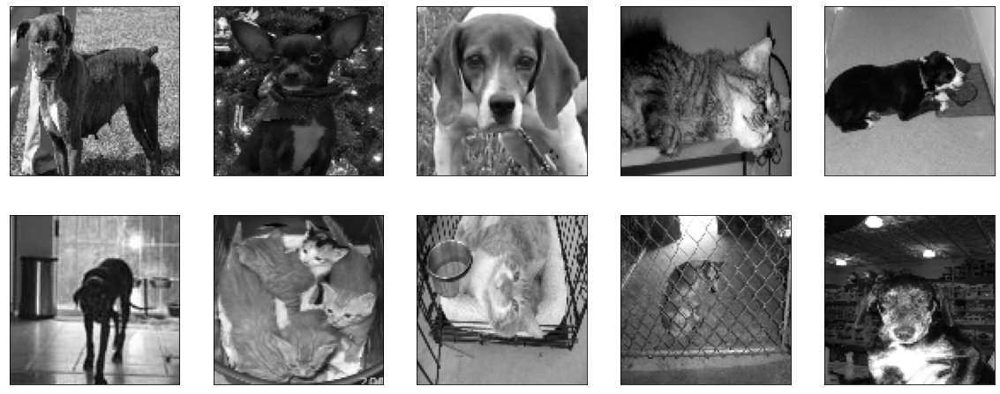

In [27]:
plt.figure(figsize=(20, 8))

for i in range(10):
  plt.subplot(2, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(X[i].reshape(100, 100), cmap = 'gray')

We use the ImageDataGenerator library that gives us many tools for data augmentation

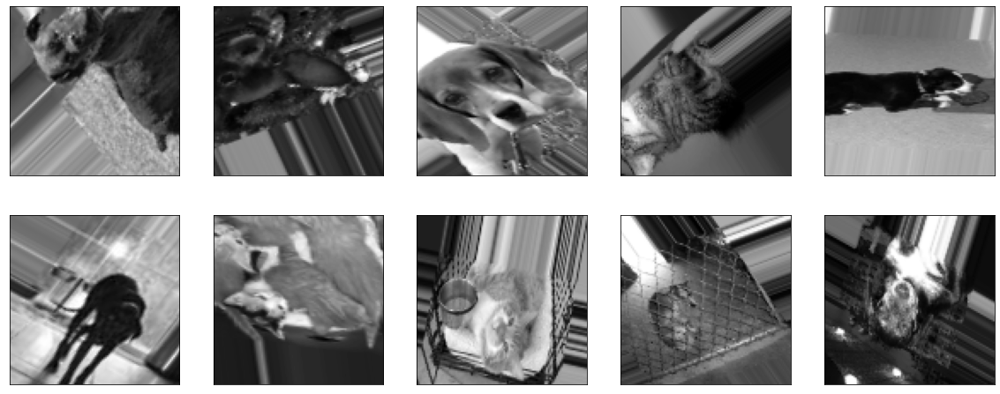

In [30]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range = 50, # Max random rotation
    width_shift_range = 0.3, # Move image to the sides between 0 and 1
    height_shift_range = 0.3, # Move image up and down between 0 and 1
    shear_range = 15, # Inclination
    zoom_range = [0.7, 1.5], # Min and max zoom to the image
    vertical_flip = True,
    horizontal_flip = True
)

datagen.fit(X)

plt.figure(figsize=(20, 8))

for image, label in datagen.flow(X, y, batch_size = 10, shuffle = False): # Return a new image with the changes of the generator
  for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(image[i].reshape(100, 100), cmap = 'gray')
  break


Now we create new models and train them with tha after the image generator.

In [31]:
# First Model: Dense NN with Data Augmentation

dense_model_DA = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape = (100, 100, 1)),
  tf.keras.layers.Dense(150, activation = 'relu'),
  tf.keras.layers.Dense(150, activation = 'relu'),
  tf.keras.layers.Dense(1, activation = 'sigmoid')
])

# Second Model: Convolutional NN with Data Augmentation

cnn_model_DA = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3, 3), activation = 'relu', input_shape = (100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3, 3), activation = 'relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3, 3), activation = 'relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(100, activation = 'relu'),
  tf.keras.layers.Dense(1, activation = 'sigmoid')
])

# Third Model: CNN with 0.5 Dropout with Data Augmentation

cnn_do_model_DA = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3, 3), activation = 'relu', input_shape = (100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3, 3), activation = 'relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3, 3), activation = 'relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  
  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation = 'relu'),
  tf.keras.layers.Dense(1, activation = 'sigmoid')
])

In [32]:
dense_model_DA.compile(optimizer = 'adam',
                    loss = 'binary_crossentropy',
                    metrics = ['accuracy'])

cnn_model_DA.compile(optimizer = 'adam',
                    loss = 'binary_crossentropy',
                    metrics = ['accuracy'])

cnn_do_model_DA.compile(optimizer = 'adam',
                    loss = 'binary_crossentropy',
                    metrics = ['accuracy'])

We need to divide the dataset into training and test

In [49]:
X_train = X[:18610] # 80% of the original data
X_valid = X[18610:] # 20% of total data

y_train = y[:18610]
y_valid = y[18610:]

Prepare the transformed data to training

In [51]:
data_gen_train = datagen.flow(X_train, y_train, batch_size = 32)

Train the models and store tha logs to show them on Tensor Board

In [52]:
tensorboardDense_DA = TensorBoard(log_dir = 'logs/dense_DA')

dense_model_DA.fit(
    data_gen_train,
    epochs = 100,
    batch_size = 32,
    validation_data = (X_valid, y_valid), # Validation data
    steps_per_epoch = int(np.ceil(len(X_train) / float(32))), # Number od data by batch size
    validation_steps = int(np.ceil(len(X_valid) / float(32))),
    callbacks = [tensorboardDense_DA]
)

Epoch 1/100
582/582 [==============================] - 23s 40ms/step - loss: 0.6932 - accuracy: 0.4971 - val_loss: 0.6932 - val_accuracy: 0.4961
Epoch 2/100
582/582 [==============================] - 23s 39ms/step - loss: 0.6932 - accuracy: 0.4988 - val_loss: 0.6931 - val_accuracy: 0.5039
Epoch 3/100
582/582 [==============================] - 23s 39ms/step - loss: 0.6932 - accuracy: 0.4968 - val_loss: 0.6932 - val_accuracy: 0.4961
Epoch 4/100
582/582 [==============================] - 23s 39ms/step - loss: 0.6932 - accuracy: 0.4966 - val_loss: 0.6932 - val_accuracy: 0.4961
Epoch 5/100
582/582 [==============================] - 23s 39ms/step - loss: 0.6932 - accuracy: 0.4997 - val_loss: 0.6932 - val_accuracy: 0.4961
Epoch 6/100
582/582 [==============================] - 22s 38ms/step - loss: 0.6932 - accuracy: 0.4998 - val_loss: 0.6932 - val_accuracy: 0.4961
Epoch 7/100
582/582 [==============================] - 22s 38ms/step - loss: 0.6932 - accuracy: 0.4966 - val_loss: 0.6931 - val_ac

In [53]:
tensorboardcnn_DA = TensorBoard(log_dir = 'logs/cnn_DA')

cnn_model_DA.fit(
    data_gen_train,
    epochs = 100,
    batch_size = 32,
    validation_data = (X_valid, y_valid),
    steps_per_epoch = int(np.ceil(len(X_train) / float(32))),
    validation_steps = int(np.ceil(len(X_valid) / float(32))),
    callbacks = [tensorboardcnn_DA]
)

Epoch 1/100
582/582 [==============================] - 33s 55ms/step - loss: 0.6883 - accuracy: 0.5447 - val_loss: 0.6828 - val_accuracy: 0.5692
Epoch 2/100
582/582 [==============================] - 30s 52ms/step - loss: 0.6807 - accuracy: 0.5697 - val_loss: 0.6584 - val_accuracy: 0.6002
Epoch 3/100
582/582 [==============================] - 29s 49ms/step - loss: 0.6677 - accuracy: 0.5947 - val_loss: 0.6523 - val_accuracy: 0.6322
Epoch 4/100
582/582 [==============================] - 29s 50ms/step - loss: 0.6602 - accuracy: 0.6063 - val_loss: 0.6425 - val_accuracy: 0.6318
Epoch 5/100
582/582 [==============================] - 28s 49ms/step - loss: 0.6490 - accuracy: 0.6220 - val_loss: 0.6255 - val_accuracy: 0.6552
Epoch 6/100
582/582 [==============================] - 30s 51ms/step - loss: 0.6399 - accuracy: 0.6303 - val_loss: 0.6065 - val_accuracy: 0.6728
Epoch 7/100
582/582 [==============================] - 28s 49ms/step - loss: 0.6284 - accuracy: 0.6484 - val_loss: 0.6118 - val_ac

In [54]:
tensorboardcnn_do_DA = TensorBoard(log_dir = 'logs/cnn_do_DA')

cnn_do_model_DA.fit(
    data_gen_train,
    epochs = 100,
    batch_size = 32,
    validation_data = (X_valid, y_valid),
    steps_per_epoch = int(np.ceil(len(X_train) / float(32))),
    validation_steps = int(np.ceil(len(X_valid) / float(32))),
    callbacks = [tensorboardcnn_do_DA]
)

Epoch 1/100
582/582 [==============================] - 29s 49ms/step - loss: 0.6852 - accuracy: 0.5491 - val_loss: 0.6722 - val_accuracy: 0.5707
Epoch 2/100
582/582 [==============================] - 30s 52ms/step - loss: 0.6673 - accuracy: 0.5979 - val_loss: 0.6599 - val_accuracy: 0.6079
Epoch 3/100
582/582 [==============================] - 28s 48ms/step - loss: 0.6632 - accuracy: 0.6040 - val_loss: 0.6316 - val_accuracy: 0.6389
Epoch 4/100
582/582 [==============================] - 28s 48ms/step - loss: 0.6503 - accuracy: 0.6227 - val_loss: 0.7026 - val_accuracy: 0.5707
Epoch 5/100
582/582 [==============================] - 29s 49ms/step - loss: 0.6495 - accuracy: 0.6186 - val_loss: 0.6391 - val_accuracy: 0.6367
Epoch 6/100
582/582 [==============================] - 28s 48ms/step - loss: 0.6425 - accuracy: 0.6295 - val_loss: 0.6205 - val_accuracy: 0.6649
Epoch 7/100
582/582 [==============================] - 30s 52ms/step - loss: 0.6349 - accuracy: 0.6350 - val_loss: 0.6711 - val_ac

We obtain much better results than without data augmentation. Moreover, most importantly, the accuracy and loss in the validation set achieve quite acceptable values, indicating that a good part of the previous overfitting has been removed, and the model would already be applicable in real life to correctly classify never-before-seen images.

In addition, another interesting fact is that the model does not improve its performance by incorporating dropout (at least in the variant used in this exercise). Therefore, we will choose the *convolutional network model with data augmentation and without dropout* as the final model.

The evaluation of new variants of the model, altering the number of epochs, layers, neurons, etc., is left to future updates.

### Saving and exporting the model

In [62]:
# Save model and it's weights

cnn_model_DA.save('cats_vs_dogs_classifier.h5')

In [57]:
# Download it (for future use)

from google.colab import files

files.download('cats_vs_dogs_classifier.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [58]:
# Convert it to tensorflow.js

'''
TensorFlow.js is an open-source hardware-accelerated JavaScript library 
for training and deploying machine learning models.
'''

!pip install tensorflowjs

     |████████████████████████████████| 64 kB 2.6 MB/s 


In [64]:
# Create a directory to save all files generated

!mkdir export_dir

In [65]:
# Convert and store it in the directory

!tensorflowjs_converter --input_format keras cats_vs_dogs_classifier.h5 export_dir

In [66]:
# Confirm the creation of the "bin" and "json" files

!ls export_dir

group1-shard1of2.bin  group1-shard2of2.bin  model.json
